# Introduction

## Nama : Hilman Hibabullah
## Batch : FTDS05

## Objektif dalam Milestone ini adalah melakukan supervised learning pada dataset Airplane pasanger satisfaction, untuk memprediksi apakah pasanger puas atu tidak dalam pelayanan airplane. Dan menentukan model yang paling bagus untuk di deploy ke dalam streamlt. Dataset pada Milestone ini bersumber di https://www.kaggle.com/binaryjoker/airline-passenger-satisfaction

# Import Library

In [1]:
# Packages for Cleaning and Processing
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Packages for Feature Engineering and Preprocessing
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline


# Packages for Machine Learning and Modelling
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

# Packages for Evaluation
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import SCORERS

import warnings
warnings.filterwarnings('ignore')


# Data Loading

In [2]:
df = pd.read_csv('ML2 Airline passenger_satisfaction.csv')
pd.set_option('display.max.columns', None) 
df


,Unnamed: 0,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,129875,Male,disloyal Customer,34,Business travel,Business,526,3,3,3,1,4,3,4,4,3,2,4,4,5,4,0,0.0,neutral or dissatisfied
129876,129876,Male,Loyal Customer,23,Business travel,Business,646,4,4,4,4,4,4,4,4,4,5,5,5,5,4,0,0.0,satisfied
129877,129877,Female,Loyal Customer,17,Personal Travel,Eco,828,2,5,1,5,2,1,2,2,4,3,4,5,4,2,0,0.0,neutral or dissatisfied
129878,129878,Male,Loyal Customer,14,Business travel,Business,1127,3,3,3,3,4,4,4,4,3,2,5,4,5,4,0,0.0,satisfied


Dalam dataset ini terdapat 129880 rows dan 24 kolom, dengan kolom satisfaction sebagai target

# Eksplorasi Data, Cleaning Data & EDA

## Cleaning Data

In [3]:
# Cek Missing value

missing = pd.DataFrame(df.isnull().sum(), columns=['No. of missing values'])
missing['% missing_values'] = (missing/len(df)).round(2)*100
missing

,No. of missing values,% missing_values
Unnamed: 0,0,0.0
Gender,0,0.0
customer_type,0,0.0
age,0,0.0
type_of_travel,0,0.0
customer_class,0,0.0
flight_distance,0,0.0
inflight_wifi_service,0,0.0
departure_arrival_time_convenient,0,0.0
ease_of_online_booking,0,0.0


In [4]:
# cek data duplicate

print("duplicate data : ", df.duplicated().sum())

duplicate data :  0


Tidak ada data duplicate pada dataset ini

ada beberapa data yang missing, daa tersebut merupakan data missing value MAR, namun karena jumlahnya sangat sedikit yaitu 0,3% dari data set maka dapat di hapus

In [5]:
# Hapus Missing value

df = df.dropna(axis='rows')
df = df.drop(columns='Unnamed: 0', axis=1)

Menghapus missing value dalam rows arrival_delay_in_minutes dan kolom Unnamed : 0 karena kolom Unnamed : 0 tidak berguna dalam data ini

## Eksplorasi Data

In [6]:
# Melihat unique value dalam kolom object

for col in df.select_dtypes(['object']).columns:
    print(col,":" ,(df[col].value_counts()))
    print("")

Gender : Female    65703
Male      63784
Name: Gender, dtype: int64

customer_type : Loyal Customer       105773
disloyal Customer     23714
Name: customer_type, dtype: int64

type_of_travel : Business travel    89445
Personal Travel    40042
Name: type_of_travel, dtype: int64

customer_class : Business    61990
Eco         58117
Eco Plus     9380
Name: customer_class, dtype: int64

satisfaction : neutral or dissatisfied    73225
satisfied                  56262
Name: satisfaction, dtype: int64



Dapat dilihat dari jumlah isi unique value tidak ada data unknown, dan untuk kolom target satisfaction terlihat seklias data lumayan balance

Dlam dataset ini juga berarti data ini adalah Low Cardinnality karena unique value maksimal hanya berjumlah 3

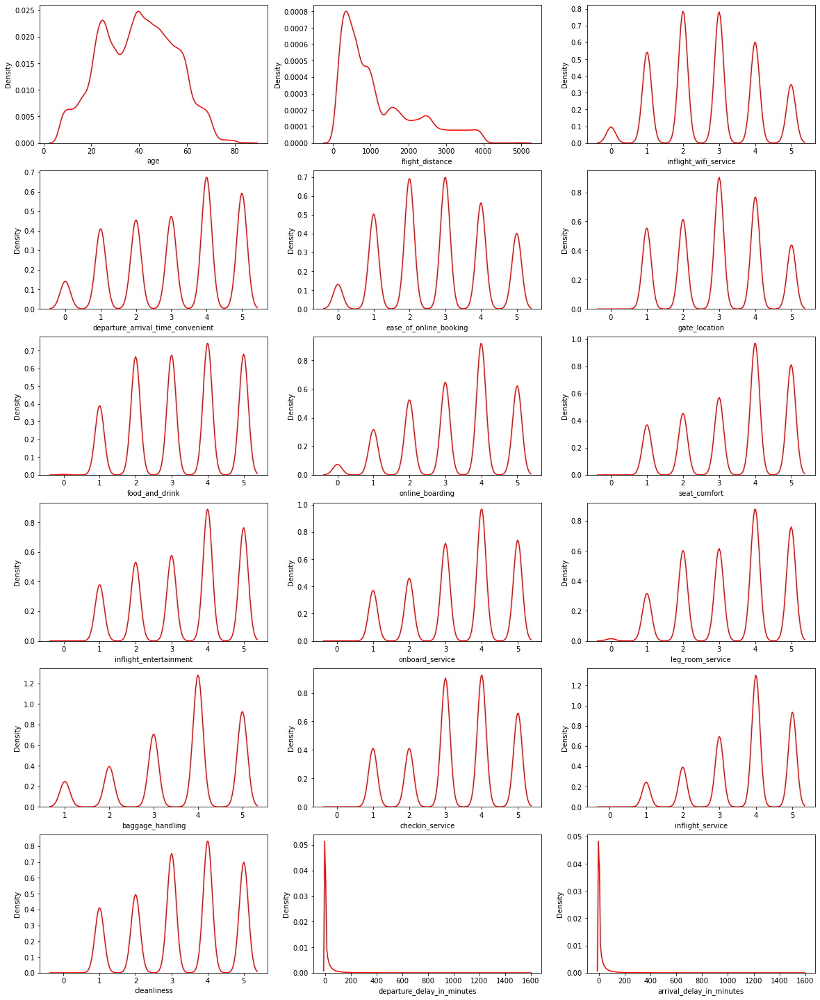

In [7]:
# Distribusi Data

plt.figure(figsize=(20,30))
for i, col_num in enumerate(df.select_dtypes("number")):
    ax = plt.subplot(7, 3, i+1)
    sns.kdeplot(x=df[col_num], color="r")
plt.show()

Sekilas terlihat distribution data kebnyakan distribusi normal, dan ada beberaa yang skew. mari cek 

In [8]:
for col in df.select_dtypes(['number']).columns:
    print(col,':' ,(df[col].skew()))
    print("")

age : -0.0033764472026258253

flight_distance : 1.1084329966476683

inflight_wifi_service : 0.04040288675550489

departure_arrival_time_convenient : -0.3322959832393894

ease_of_online_booking : -0.018562304577225523

gate_location : -0.058323993680748316

food_and_drink : -0.15505464378398254

online_boarding : -0.45702588067818495

seat_comfort : -0.48621100783011767

inflight_entertainment : -0.3664861153907667

onboard_service : -0.42148502167322965

leg_room_service : -0.3484745828106413

baggage_handling : -0.6774641678374012

checkin_service : -0.3665794798787811

inflight_service : -0.6921182799153675

cleanliness : -0.30092631314581003

departure_delay_in_minutes : 6.853577955923476

arrival_delay_in_minutes : 6.670124610533309



Kolom yang mempunya nilai < -0,5 dan > 0,5 dalah kolom yang memiliki skewnes.

Kolom flight_distance, beggage_handling, inflight_service, derpature_delay_in_minutes, arrival_delay_in_minutes adalah kolom yang memiliki distribusi skew

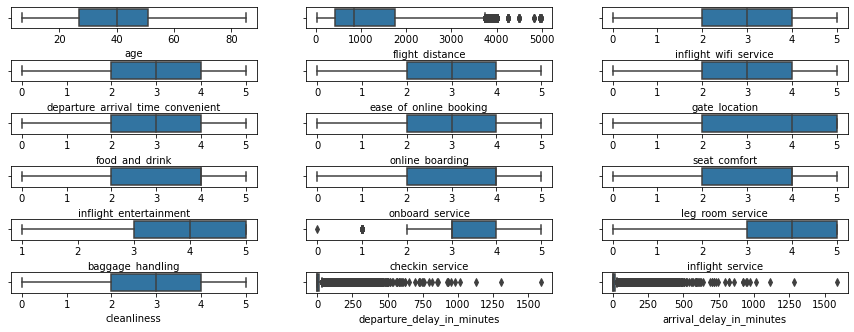

In [9]:
# Display numerical columns with boxplot to see the outlier

plt.figure(figsize=(15,15))
plt.subplots_adjust(hspace=1.5)
for i, col_num in enumerate(df.select_dtypes('number')):
    ax = plt.subplot(16,3,i+1)
    sns.boxplot(x=df[col_num])

Dapat dilihat ada beberapa outlier. apakah harus dihilangkan? mari kita cek

In [10]:
# Cek data outlier pada kolom flight distance denga distance diatas 3500 sesuai penglihatan dari boxplot

df_distance = df[
    (df['flight_distance'] >= 3500)
]
df_distance

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
80,Male,Loyal Customer,26,Business travel,Business,3960,1,1,1,1,4,4,4,4,4,2,5,4,4,4,45,48.0,satisfied
119,Female,Loyal Customer,46,Business travel,Business,3705,4,3,3,3,4,3,4,4,4,4,4,4,4,4,4,0.0,neutral or dissatisfied
132,Female,Loyal Customer,21,Business travel,Business,3510,3,1,1,1,3,2,3,3,3,3,3,1,3,3,0,0.0,neutral or dissatisfied
148,Female,Loyal Customer,55,Business travel,Business,3634,0,4,0,4,4,5,5,4,4,1,1,4,4,3,0,0.0,satisfied
173,Male,Loyal Customer,52,Business travel,Business,3747,5,5,5,5,2,4,5,4,4,4,4,5,4,5,24,20.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129797,Female,Loyal Customer,45,Business travel,Business,3542,1,1,2,1,3,4,4,1,1,1,1,4,1,2,0,0.0,neutral or dissatisfied
129808,Female,Loyal Customer,49,Business travel,Business,3542,3,3,3,3,5,5,5,3,4,5,5,5,5,5,90,169.0,satisfied
129836,Male,Loyal Customer,46,Business travel,Business,3701,4,4,4,4,4,4,4,4,4,4,4,5,4,3,0,0.0,satisfied
129843,Female,Loyal Customer,42,Business travel,Business,3855,1,1,1,1,1,3,1,4,4,4,4,1,4,5,0,0.0,satisfied


In [11]:
df_distance.type_of_travel.value_counts()

Business travel    5176
Personal Travel      47
Name: type_of_travel, dtype: int64

Setelah dilihat data flight distance. Data yang tergolong outlier adalah data dengan customer yang berpergian untuk bisnis travel, sehingga menempuh jarak penerbangan di atas rata rata. Sehingga datatersebut tidak bisa dibilang sebagai outlier dengan Natural error sehingga tidak perlu di hapus

In [12]:
# Cek data yang termasuk outlier pada data derpature

derpature = df['departure_delay_in_minutes']

derpature_out = derpature.quantile(0.75)+1.5*(derpature.quantile(0.75)-derpature.quantile(0.25))
print('Derpature Outlier :' ,derpature_out)

arrival = df['arrival_delay_in_minutes']

arrival_out = arrival.quantile(0.75)+1.5*(arrival.quantile(0.75)-arrival.quantile(0.25))
print('Derpature Outlier :' ,arrival_out)


Derpature Outlier : 30.0
Derpature Outlier : 32.5


Jika dilihat dari batas atas outlier kolom derpature delay, data yang diatas 30 adalah data yang termasuk outlier, mari kita lihat

In [13]:
df_delay = df[
    (df['departure_delay_in_minutes'] >= 30) &
    (df['departure_delay_in_minutes'] >= 32.5)
]
df_delay

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
14,Female,Loyal Customer,26,Personal Travel,Eco,453,3,2,3,2,2,3,2,2,4,3,2,2,1,2,43,35.0,neutral or dissatisfied
16,Female,Loyal Customer,26,Business travel,Business,2123,3,3,3,3,4,4,4,4,5,3,4,5,4,4,49,51.0,satisfied
22,Female,Loyal Customer,43,Personal Travel,Eco,752,3,5,3,5,5,4,5,3,3,3,5,3,3,4,52,29.0,neutral or dissatisfied
24,Female,disloyal Customer,23,Business travel,Eco,452,5,0,5,1,1,5,1,1,4,5,5,3,5,1,54,44.0,satisfied
32,Female,Loyal Customer,35,Business travel,Business,2611,4,5,4,4,4,4,4,3,3,4,5,4,3,4,109,120.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129829,Female,Loyal Customer,29,Business travel,Business,689,2,2,2,2,3,3,3,3,4,2,5,5,5,3,48,46.0,satisfied
129838,Female,Loyal Customer,41,Business travel,Business,2748,1,2,2,2,1,4,4,1,1,1,1,3,1,3,83,79.0,neutral or dissatisfied
129839,Female,Loyal Customer,39,Business travel,Business,2291,2,2,1,1,5,2,2,2,2,2,2,1,2,1,70,64.0,neutral or dissatisfied
129846,Male,Loyal Customer,44,Personal Travel,Eco,404,3,1,3,2,3,5,2,2,4,2,3,2,4,2,131,138.0,neutral or dissatisfied


Dapat dilihat data yang termasuk dalam outlier pada derpature ada juga pada arrival delay, hal ini karena dalam penerbangan derpature dan arrival delay adalah hal yang normal, yang berarti outlier dalam data ini adalah Natural Error

Kesimpulannya semua outlier pada dataset ini adalah outlier dengan Natural Error sehingga kita tidak perlu menghapus outlier, namun dalam pemilihan model hindari model yang berhubungan dengan jarak

## Visualisasi EDA

In [14]:
df

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,Male,disloyal Customer,34,Business travel,Business,526,3,3,3,1,4,3,4,4,3,2,4,4,5,4,0,0.0,neutral or dissatisfied
129876,Male,Loyal Customer,23,Business travel,Business,646,4,4,4,4,4,4,4,4,4,5,5,5,5,4,0,0.0,satisfied
129877,Female,Loyal Customer,17,Personal Travel,Eco,828,2,5,1,5,2,1,2,2,4,3,4,5,4,2,0,0.0,neutral or dissatisfied
129878,Male,Loyal Customer,14,Business travel,Business,1127,3,3,3,3,4,4,4,4,3,2,5,4,5,4,0,0.0,satisfied


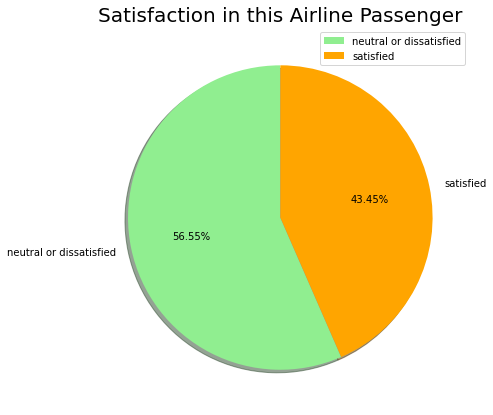

In [15]:
# Melihat komposisi target

labels = ['neutral or dissatisfied', 'satisfied']
size = df['satisfaction'].value_counts()
colors = ['lightgreen', 'orange']
explode = [0, 0.001]

plt.rcParams['figure.figsize'] = (7, 7)
plt.pie(size, colors = colors, explode = explode, labels = labels, shadow = True, startangle = 90, autopct = '%.2f%%')
plt.title('Satisfaction in this Airline Passenger', fontsize = 20)
plt.axis('off')
plt.legend()
plt.show()

Untuk tingkat satisfaction passenger yang neutral or dissatisfied adalah 56.55%  atau sekitar 73.224

Sementara untuk tingkat satisfaction passenger yang satisfied adalah 43.45% atau sekitar 56.263

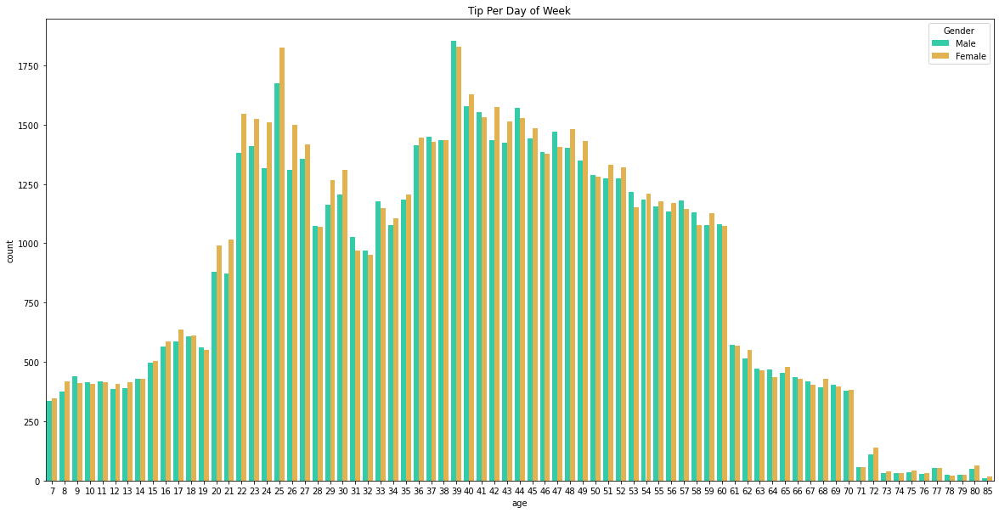

In [16]:
# Melihat persebaran age dalam data

plt.figure(figsize=(20, 10))
sns.countplot(x = 'age', hue='Gender', 
            palette = 'turbo',
            data=df)
plt.xlabel("age")
plt.title("Tip Per Day of Week")
plt.show()

Dapat dilihat dari barchart diatas bahwa umur passenger ada dari umur 7 tahun sampai 85 tahun. Paling banyak passenger yang melakukan penerbangan dalam airline ini adalah passenger dengan umur 39 tahun.

Untuk laki laki paling banyak passenger diumur 39, sedangkan wanita paling banyak di umur 25. Hal ini bisa terjadi karena wanita banyak yang suka melakukan perjalanan dengan pesawat baik untuk traveling ataupun bekerja. Sementara untuk laki laki mungkin yang paling banyak adalah di umur 39 untuk keperluan perjalanan bisnis

In [17]:
fig = px.histogram(df, x="age", color="satisfaction")
fig.show()

Sementara itu untuk tingkat kepuasan penerbangan, pada passenger dirange mur 20-25 banyak yang neutral or dissatisfied cenderung turun disekitar range age sudah mulai memasuki umur 45

Kebalikannya passenger dengan range umur 30-45 banyak yang satisfied dalam penerbangan ini.

Hal ini mungkin terjadi karena apabila semakin tinggi umur maka semakin banyak pengalaman meakukan penerbangan sehingga pengalaman tersebut lebih banyak satisfied nya, sementara mungkin jika umur masih cukup muda masih banyak yang di keluhkan dalam penerbangan karena mungkin passenger di umur muda banyak menuntut dan selalu ingin diberikan service yang nyaman

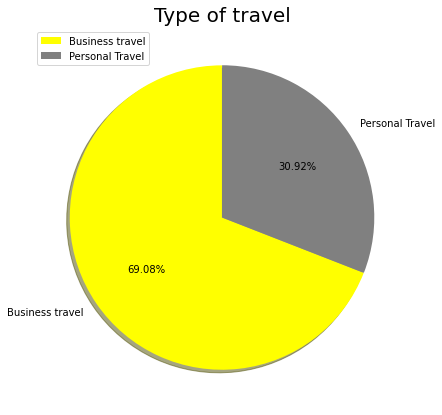

In [18]:
# Melihat komposisi tujun passenger untuk melakukan penerbangan

labels = ['Business travel','Personal Travel']
size = df['type_of_travel'].value_counts()
colors = ['yellow', 'grey']
explode = [0, 0.001]

plt.rcParams['figure.figsize'] = (7, 7)
plt.pie(size, colors = colors, explode = explode, labels = labels, shadow = True, startangle = 90, autopct = '%.2f%%')
plt.title('Type of travel', fontsize = 20)
plt.axis('off')
plt.legend()
plt.show()

Dari pie chart bisa diliha bahwa 69.08% pessenger atau sekitar 89.450 passenger yang melakukan penerbangan untuk kepentingan bisnis

Sementara ada 30.92% passenger atau sekitar 40.038 passenger yang sengaja melakukan penerbangan untuk kepentingan pribadi, mungkin untuk pulang ke kota asal, ataupun untuk liburan

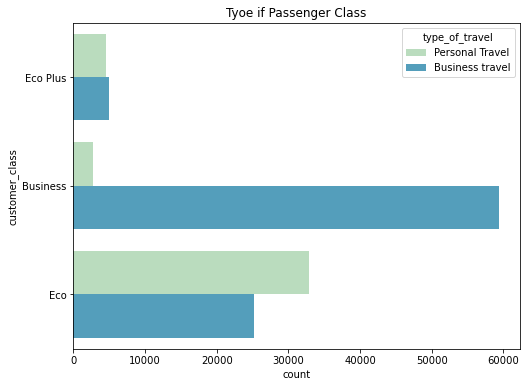

In [19]:
# Melihat penggunaan class penerbangan

plt.figure(figsize=(8, 6))
sns.countplot(y = 'customer_class', hue='type_of_travel', 
            palette = 'GnBu',
            data=df)
plt.ylabel("customer_class")
plt.title("Tyoe if Passenger Class")
plt.show()

Dapat dilihat untuk Class Eco Plus adalah class yang paling sedikit digunakan, karena mungkin tanggung untuk mengamil clas Eco Plus dalam segi keuntungan lebih baik mengambil Business Class, maka dari itu untuk class Eco Plus sedikit yang menggunakan nya, namun untuk pengambilan Eco Plus digunakan untuk Personal Travel maupun Business travel

Sementara itu untuk kelas Bussiness class sangat banyak digunakan untuk keperluan perjanan untuk Bisnis. Sangat sedikit passenger yang menggunakan bisnis class untuk personal travel. Mungkin ini disebabkan karena harga yang terlalu mahal dalam bisnis class dan kemampuan passenger tidak memumpuni. Selain itu bisa juga jika tipe passenger dalam data ini adalah tipe yang tidak terlalu mementingkan prestige dalam kehidupan sehari harinya

Oleh karena itu Class Eco adalah Class yang pembagiaanya rata untuk passenger yang ingin melakukan Business travel ataupun untuk personal travel

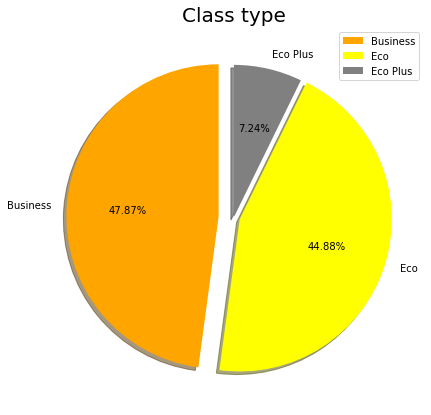

In [20]:
# Melihat komposisi pengambilan class penerbangan

labels = ['Business','Eco','Eco Plus']
size = df['customer_class'].value_counts()
colors = ['orange', 'yellow', 'grey']
explode = [0.1, 0.04, 0.003]

plt.rcParams['figure.figsize'] = (7, 7)
plt.pie(size, colors = colors, explode = explode, labels = labels, shadow = True, startangle = 90, autopct = '%.2f%%')
plt.title('Class type', fontsize = 20)
plt.axis('off')
plt.legend()
plt.show()

Menariknya dalam data ini Class yang diambil passenger paling banyak adalah Business class yaitu sebesar 47.87% atau sekitar 61.986 passenger. Hal ini berarti pelayanan Business class dalam penerbangan ini sangat bagus dan berkesan untuk para passenger, atau juga banyaknya bisnisman atau bisniswoman yang menggunakan penerbangan ini, karena dalam informasi sebelumnya Business class sangat didominasi oleh passenger yang ingin melakukan Business travel

Unutk kelas Eco ada sekitar 44.88% atau sekitar 58.088 passenger, untuk kelas Eco Plus paling rendah yaitu sekitar 7.24% atau sekitar 93.749 passenger yang menggunakan class tersebut

In [21]:
df.sample(1)

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
38568,Female,Loyal Customer,38,Business travel,Business,3997,4,4,4,4,2,5,5,4,4,4,4,5,4,4,0,0.0,satisfied


In [22]:
# Melihat apakah jarak suatu penerbangan mempengaruhi class yang di ambil

fig = px.histogram(df, x="flight_distance", color="customer_class")
fig.show()

Dapat kita lihat bahwa jarak penerbangan tidak mempengaruhi orang untuk mengambi class tertentu. Seharusnya jika semakin jauh jarak penerbangan akan lebih nyaman jika passenger mengambil business class, namun dalam data ini masih ada passenger lebih memilih untuk mengambi clas eco untuk jarak penerbangan yang jauh

Meskipun begitu memang bisa dilihat dari histogramnya, bahwa passenger yang menggunakan business class lebih banyak yang mempunya jarak penerbangan yang cukup jauh

Sementara itu jarak penerbangan yang tidak cukup jauh yaitu sekitar dari range 60 - 1110 passenger lebih banyak memilih untuk mengambil Eco class

In [23]:
# Melihat apakah jarak penerbangan menentukan satisfaction passenger itu sendiri

fig = px.histogram(df, x="flight_distance", color="satisfaction")
fig.show()

Dapat terlihat semakin jauh penerbangan masih ada passenger yang satisfied untuk penerbangan ini, hal ini menunjukan hal bagus karena semakin jauh jarak penerbangan maka semakin banyak waktu yang rasakan passenger didalam pesawat, dan tentu jika pelayanan tidak bagus seharusnya banyak yang neutral atau disstatiesfied. Namun hal ini bisa karena lebih banyak yang mengambil Business class jika melakukan jarak penerbangan yang cukup jauh tentu kita tau jka pelayanan business class pasti bagus dan berkesan sehingga bisa membuat passenger satisfied

In [24]:
df.sample(1)

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
11913,Male,Loyal Customer,46,Business travel,Business,2643,3,3,3,3,2,4,4,3,3,3,3,5,3,3,0,3.0,satisfied


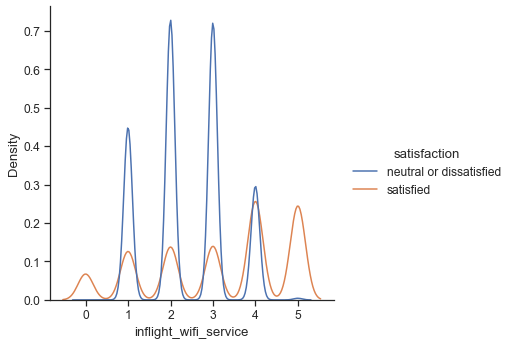

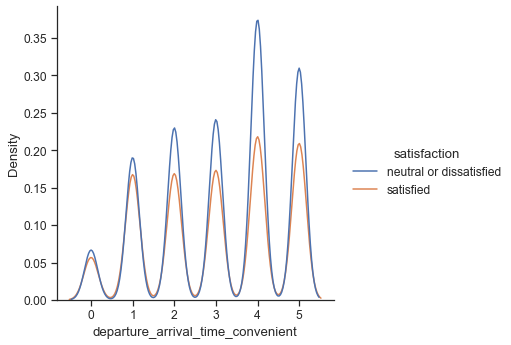

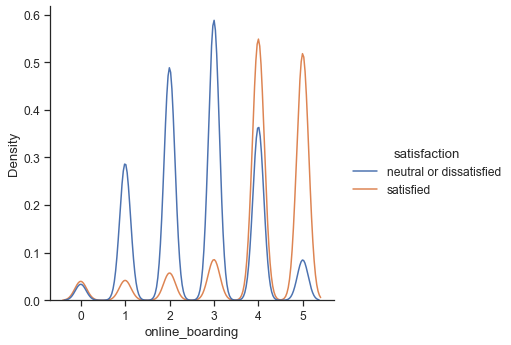

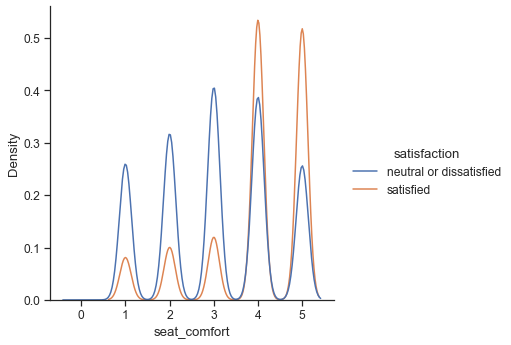

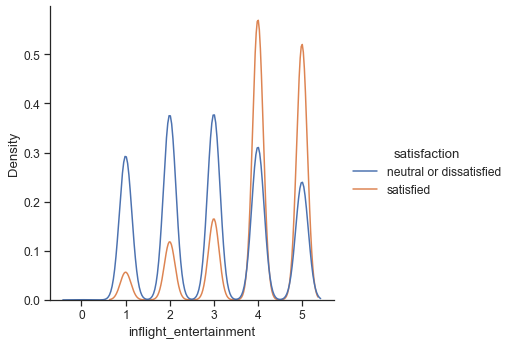

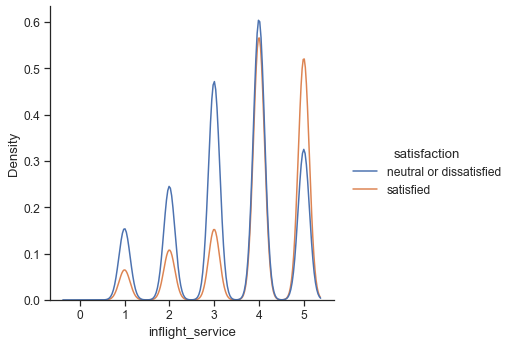

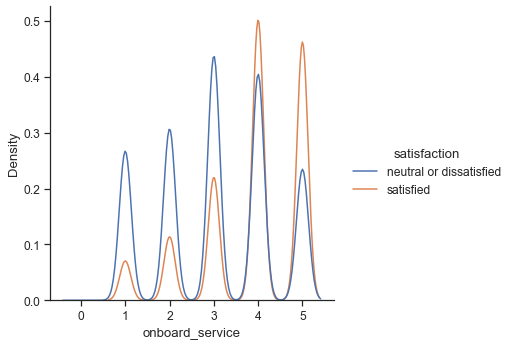

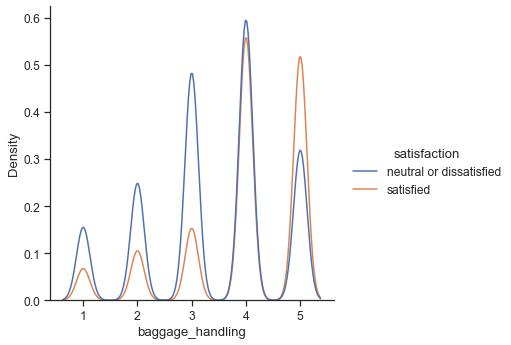

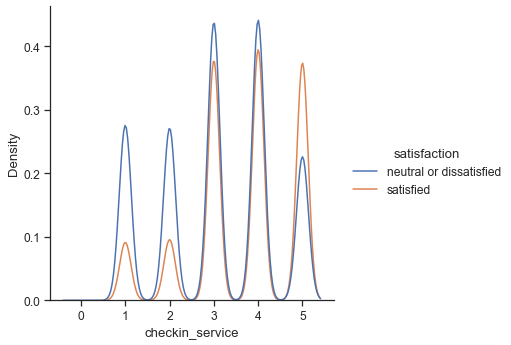

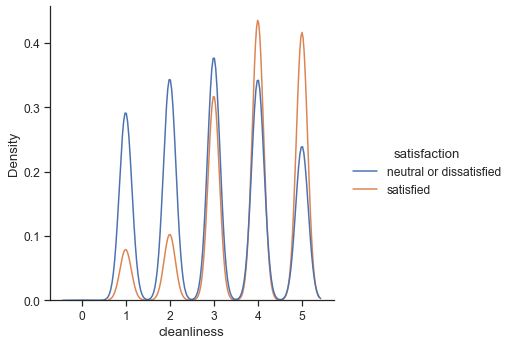

In [25]:
# melihat fitur yang menjadi fasilitas


fasilitas = ['inflight_wifi_service', 'departure_arrival_time_convenient', 'online_boarding', 'seat_comfort', 'inflight_entertainment',
             'inflight_service', 'onboard_service', 'baggage_handling', 'checkin_service', 'cleanliness']


sns.set(font_scale= 1.1)
sns.set_style('ticks')

for i, col in enumerate(fasilitas):
    sns.displot(data=df, x=col, kind='kde', hue='satisfaction')  
   
sns.despine()

Insflight wifi service:
- Dalam hal ini bisa dilihat jika semakin tinggi kualitas wifi yang di berikan maka semakin tinggi passenger akan merasa satisfied, bahkan di nilai 5 untuk inflight wifi service tidak ada passenger yang neutral atau dissatisfied. 

Departure arrival time convenient:
- Tingkat kenyamanan dalam masalah keberangkatan ataupun kedatangan tidak mempengaruhi satisfaction passenger

Online Boarding:
- Semakin tinggi kualitas pelayanan online boarding maka semakin tinggi satisfaction passenger, jika kualitas sedang buruk maka passenger akan merasa dissatisfied atau neutral. Hal ini tentu di karenakan semakin majunya zaman maka akan sangat menyenangkan jika hal yang berhubungan dengan online lancar lancar saja

Seat Comfort:
- Semakin nyaman seat suatu airplane maka tentu akan membuat passenger statisfied, jika suatu seat airplane memiliki kualitas yang buruk tentu passenger akan dissatisfied atau neutral, namun anehnya masih ada yang dissatisfied atau neutral walaupun kualitas seat sudah tinggi. Mungkin hal ini karena passenger tersebut memiliki standar nyaman yang tinggi untuk dirinya sendiri

Inflight Entertainment:
- Didalam penerbangan tentu menyenangkan jika mendapatkan entertain dari pihak airline dan membuat passenger merasa statisfied

Inflight Service, On board & Check in service:
- Tentu semakin bagus service baik dalam inflight ataupun dalam onboard suatu airline maka akan membuat passenger merasa statisfied, begitu juga untuk check in service, namun masih ada juga passenger yang merasa dissatisfied atau neutral walaupun sudah di berikan service yang bagus

Baggage Handling:
- Dalam suatu penerbangan tentu penanganan bagasi sangat membantu passenger, jika bagus pelayanannya maka tentu passenger akan merasa statisfied

Cleanliness:
- Kebersihan adalah aspek yang sangat penting bagi aspek seluruh kehidupan, tentu hal ini berlaku juga untuk airline. jika kebersihan terjaga dan bagus maka akan membuat passenger statisfied. jika tidak maka bisa dilihat rendahnya kebersihan banyak membuat passenger menjadi neutral atau dissatisfied

# Data Preprocessing

In [26]:
# Mengganti niali target menjadi 0 dan 1

df['satisfaction'] = df.satisfaction.replace({'neutral or dissatisfied':0,'satisfied':1})

In [27]:
df

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.0,0
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,Male,disloyal Customer,34,Business travel,Business,526,3,3,3,1,4,3,4,4,3,2,4,4,5,4,0,0.0,0
129876,Male,Loyal Customer,23,Business travel,Business,646,4,4,4,4,4,4,4,4,4,5,5,5,5,4,0,0.0,1
129877,Female,Loyal Customer,17,Personal Travel,Eco,828,2,5,1,5,2,1,2,2,4,3,4,5,4,2,0,0.0,0
129878,Male,Loyal Customer,14,Business travel,Business,1127,3,3,3,3,4,4,4,4,3,2,5,4,5,4,0,0.0,1


In [28]:
# Melihat korelasi tiap fitur

corr = df.corr()
corr.style.background_gradient(cmap='coolwarm')

,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
age,1.000000,0.099863,0.015779,0.036780,0.022294,-0.000709,0.023283,0.207485,0.159229,0.074990,0.056743,0.038992,-0.048192,0.033182,-0.051778,0.052575,-0.009263,-0.011248,0.134001
flight_distance,0.099863,1.000000,0.006554,-0.018901,0.064959,0.005378,0.057136,0.215082,0.157825,0.130518,0.111224,0.134548,0.064810,0.073635,0.059182,0.095658,0.001992,-0.001935,0.298206
inflight_wifi_service,0.015779,0.006554,1.000000,0.344846,0.714888,0.338547,0.132109,0.457422,0.121373,0.207887,0.120028,0.160414,0.120548,0.043847,0.110300,0.131163,-0.016046,-0.017749,0.283291
departure_arrival_time_convenient,0.036780,-0.018901,0.344846,1.000000,0.437697,0.447411,0.001057,0.072175,0.008707,-0.008189,0.067046,0.010634,0.070646,0.091217,0.072166,0.010021,0.000610,-0.000942,-0.054457
ease_of_online_booking,0.022294,0.064959,0.714888,0.437697,1.000000,0.460155,0.030638,0.404944,0.028602,0.046669,0.039039,0.109341,0.039215,0.008835,0.035356,0.015150,-0.005330,-0.007033,0.168704
gate_location,-0.000709,0.005378,0.338547,0.447411,0.460155,1.000000,-0.002825,0.002579,0.002493,0.002751,-0.029109,-0.005146,0.001097,-0.039294,0.000337,-0.006066,0.005943,0.005658,-0.002923
food_and_drink,0.023283,0.057136,0.132109,0.001057,0.030638,-0.002825,1.000000,0.233524,0.575993,0.623366,0.057476,0.033215,0.035413,0.085103,0.035424,0.658026,-0.029351,-0.031715,0.211164
online_boarding,0.207485,0.215082,0.457422,0.072175,0.404944,0.002579,0.233524,1.000000,0.419169,0.284008,0.154272,0.123149,0.083563,0.204215,0.073973,0.329331,-0.019319,-0.022730,0.501620
seat_comfort,0.159229,0.157825,0.121373,0.008707,0.028602,0.002493,0.575993,0.419169,1.000000,0.611949,0.130654,0.104244,0.074617,0.189838,0.068912,0.679657,-0.027711,-0.030521,0.348576
inflight_entertainment,0.074990,0.130518,0.207887,-0.008189,0.046669,0.002751,0.623366,0.284008,0.611949,1.000000,0.418863,0.300573,0.379291,0.119664,0.406561,0.692491,-0.027166,-0.030230,0.398334


In [29]:
# Melihat korelasi dengan target

corr['satisfaction'].sort_values()

arrival_delay_in_minutes            -0.058275
departure_arrival_time_convenient   -0.054457
departure_delay_in_minutes          -0.051032
gate_location                       -0.002923
age                                  0.134001
ease_of_online_booking               0.168704
food_and_drink                       0.211164
checkin_service                      0.237146
inflight_service                     0.245027
baggage_handling                     0.248651
inflight_wifi_service                0.283291
flight_distance                      0.298206
cleanliness                          0.306891
leg_room_service                     0.312557
onboard_service                      0.322329
seat_comfort                         0.348576
inflight_entertainment               0.398334
online_boarding                      0.501620
satisfaction                         1.000000
Name: satisfaction, dtype: float64

Ada beberapa fitur yang mempunya korelasi negatif ke satisfaction, diantaranya arrival_delay_in_minutes, departure_arrival_time_convenient, departure_delay_in_minutes, gate_location

Saya akan menghapus fitur gate_location dan departure_arrival_time_convenient namun mempertahankan fitur arrival_delay_in_minutes, departure_delay_in_minutes karena dua fitur tersebut berisi tentang adanya keterlambatan jadwal penerbangan dan kedatngan pesawat, sehingga akan mempengaruhi satisfaction passenger. Karena pasti passenger sudah mempunya jadwal ketika sebelum dan sesudah melakukan penerbangan, apalagi untuk kepentingan bisnis, tentu jika adanya keterlambatan pasti sangat merugikan passenger

In [30]:
# Hapus fitur yang tidak digunakan

df_new = df.drop(columns=['departure_arrival_time_convenient','gate_location'], axis=1)
df_new

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,ease_of_online_booking,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,3,5,3,5,5,4,3,4,4,5,5,25,18.0,0
1,Male,disloyal Customer,25,Business travel,Business,235,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,Male,disloyal Customer,34,Business travel,Business,526,3,3,4,3,4,4,3,2,4,4,5,4,0,0.0,0
129876,Male,Loyal Customer,23,Business travel,Business,646,4,4,4,4,4,4,4,5,5,5,5,4,0,0.0,1
129877,Female,Loyal Customer,17,Personal Travel,Eco,828,2,1,2,1,2,2,4,3,4,5,4,2,0,0.0,0
129878,Male,Loyal Customer,14,Business travel,Business,1127,3,3,4,4,4,4,3,2,5,4,5,4,0,0.0,1


In [31]:
# Encoding kolom kategorik dengan LabelEncoder karena data ordinal

le = LabelEncoder()

df_new.iloc[:,0] = le.fit_transform(df_new.iloc[:,0])
print("Gender classes", le.classes_)
print("")

df_new
df_new.iloc[:,1] = le.fit_transform(df_new.iloc[:,1])
print("customer_type classes", le.classes_)
print("")

df_new.iloc[:,3] = le.fit_transform(df_new.iloc[:,3])
print(" type_of_travel classes", le.classes_)
print("")

df_new.iloc[:,4] = le.fit_transform(df_new.iloc[:,4])
print("customer_class classes", le.classes_)
print("")


Gender classes ['Female' 'Male']

customer_type classes ['Loyal Customer' 'disloyal Customer']

 type_of_travel classes ['Business travel' 'Personal Travel']

customer_class classes ['Business' 'Eco' 'Eco Plus']



In [32]:
df_new

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,ease_of_online_booking,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,1,0,13,1,2,460,3,3,5,3,5,5,4,3,4,4,5,5,25,18.0,0
1,1,1,25,0,0,235,3,3,1,3,1,1,1,5,3,1,4,1,1,6.0,0
2,0,0,26,0,0,1142,2,2,5,5,5,5,4,3,4,4,4,5,0,0.0,1
3,0,0,25,0,0,562,2,5,2,2,2,2,2,5,3,1,4,2,11,9.0,0
4,1,0,61,0,0,214,3,3,4,5,5,3,3,4,4,3,3,3,0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,1,1,34,0,0,526,3,3,4,3,4,4,3,2,4,4,5,4,0,0.0,0
129876,1,0,23,0,0,646,4,4,4,4,4,4,4,5,5,5,5,4,0,0.0,1
129877,0,0,17,1,1,828,2,1,2,1,2,2,4,3,4,5,4,2,0,0.0,0
129878,1,0,14,0,0,1127,3,3,4,4,4,4,3,2,5,4,5,4,0,0.0,1


Data sudah berisi numerik semua dan akan di proses split menjadi data train dan test

## Mendifinisikan Fitur dan Target

In [33]:
# mendifinisikan fitur dan target

X = df_new.drop(columns='satisfaction', axis=1)

y = df_new['satisfaction']

In [34]:
# Split data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42, stratify=y)

# see the shape of data split

print("X_train shape", X_train.shape)
print("X_test shape", X_test.shape)
print("y_train shape", y_train.shape)
print("y_test shape", y_test.shape) 

X_train shape (90640, 20)
X_test shape (38847, 20)
y_train shape (90640,)
y_test shape (38847,)


# Definisikan Model, Penggunaan Pipeline dan Model Improvement

Karena dalam data ini saya tidak menghapus outlier, karena nilai outlier dalam data ini  adalah nilai outlier yang memiliki normal error pada data penerbangan. Sehingga saya ingin meilih beberapa model algoritma yang tidak menghitung jarak atau tidak sensitif terhadap outlier

Model yang digunakan adalah
1. Gaussian Naive Bayes, untuk dijadikan sebagai bestline atau benchmark untuk tiap model
2. Random Forest Classifier
3. Desicion Tree

## 1. Gaussian Naive Bayes

Membuat model Gaussian Naive Bayes hanya untuk bestline atau benchmark untuk model yang lain

In [35]:
# Define model dan pipeline

pipe_nb = make_pipeline(StandardScaler(), GaussianNB())

pipe_nb.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gaussiannb', GaussianNB())])

In [36]:
# predict Gaussian Naive Bayes

y_pred_nb = pipe_nb.predict(X_test)



### 1.2 Evaluasi Gaussian Naive Bayes

In [37]:
print("Evaluation Gaussian Naive Bayes")
print("accuracy_score:", pipe_nb.score(X_test,y_test))
print("Data train accuracy_score", pipe_nb.score(X_train, y_train))
print("f1_score", f1_score(y_test,y_pred_nb))
print("roc_auc_score", roc_auc_score(y_test,y_pred_nb))
print(classification_report(y_test, y_pred_nb))


Evaluation Gaussian Naive Bayes
accuracy_score: 0.8653950111977758
Data train accuracy_score 0.8610657546337158
f1_score 0.8416174466151749
roc_auc_score 0.8604953630909726
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     21968
           1       0.86      0.82      0.84     16879

    accuracy                           0.87     38847
   macro avg       0.86      0.86      0.86     38847
weighted avg       0.87      0.87      0.86     38847



Gaussian Naive Bayes:
- Untuk accuracy score test data adalah 0.8653
- Untuk accuracy score train data adalah 0.8610
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.84161
- Dan memiliki nilai Roc auc score 0.8604

Karena Gaussian Naive Bayes hanya sebagai bestline atau benchmark, maka model selanjutnya harus memiliki score yang lebih tinggi dari Gaussian Naive Bayes

## 2. Random Forest Classifier

Random Forest Classifier adalah salah satu algoritma yang tidak berpengaruh jika ada iutlier

In [38]:
# Define Random Forest Model

pipe_rf = make_pipeline(StandardScaler(), RandomForestClassifier(
                       n_estimators=200,
                       max_depth = 5,
                       random_state=42))
pipe_rf.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=5, n_estimators=200,
                                        random_state=42))])

In [39]:
# predict Random Forest dengan manual hperparameter

y_pred_rf_manual = pipe_rf.predict(X_test)

### 2.1 Evaluasi Random Forest Classifier Dengan Hyperparameter Manual

In [40]:
print("Evaluation Random Forest Manual Hyperparameter")
print("accuracy_score:", pipe_rf.score(X_test,y_test))
print("Data train accuracy_score", pipe_rf.score(X_train, y_train))
print("f1_score", f1_score(y_test,y_pred_rf_manual))
print("roc_auc_score", roc_auc_score(y_test,y_pred_rf_manual))
print(classification_report(y_test, y_pred_rf_manual))


Evaluation Random Forest Manual Hyperparameter
accuracy_score: 0.9281282981954848
Data train accuracy_score 0.9256067961165049
f1_score 0.916542117534525
roc_auc_score 0.925830291712138
              precision    recall  f1-score   support

           0       0.93      0.94      0.94     21968
           1       0.92      0.91      0.92     16879

    accuracy                           0.93     38847
   macro avg       0.93      0.93      0.93     38847
weighted avg       0.93      0.93      0.93     38847



Random Forest dengan manual Hyperparameter:
- Untuk accuracy score test data adalah 0.9281
- Untuk accuracy score train data adalah 0.9256
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.91654
- Dan memiliki nilai Roc auc score 0.9258

Dari Hasil menunjukan model sudah bagus karena melebihi score dari Gaussian Naive Bayes baik dari score accuracy, f1 score dan roc auc score

### 2.2 Model Improvement Gridsearch RandomForest

In [41]:
# parameter untuk randomforest

param_grid_rf = {'randomforestclassifier__n_estimators': [100, 250, 300],
                 'randomforestclassifier__max_depth' : [3,5,7],
                 'randomforestclassifier__criterion' : ['gini','entropy'],
                 'randomforestclassifier__random_state' : [40, 42, 50]
                }
print('param_grid_rf:', param_grid_rf )

param_grid_rf: {'randomforestclassifier__n_estimators': [100, 250, 300], 'randomforestclassifier__max_depth': [3, 5, 7], 'randomforestclassifier__criterion': ['gini', 'entropy'], 'randomforestclassifier__random_state': [40, 42, 50]}


In [42]:
# Gridsearch

grid_rf = GridSearchCV(pipe_rf, param_grid=param_grid_rf, cv=5, n_jobs=-1, verbose=2)

grid_rf.fit(X_train, y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(max_depth=5,
                                                               n_estimators=200,
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__criterion': ['gini',
                                                               'entropy'],
                         'randomforestclassifier__max_depth': [3, 5, 7],
                         'randomforestclassifier__n_estimators': [100, 250,
                                                                  300],
                         'randomforestclassifier__random_state': [40, 42, 50]},
             verbose=2)

In [43]:
# Melihat best estimator dari gridsearch

best_rf_grid = grid_rf.best_estimator_
print(best_rf_grid)
print('')

best_rf_param = grid_rf.best_params_
print(best_rf_param)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=7, random_state=40))])

{'randomforestclassifier__criterion': 'gini', 'randomforestclassifier__max_depth': 7, 'randomforestclassifier__n_estimators': 100, 'randomforestclassifier__random_state': 40}


In [44]:
# predict dengan hyperparameter dari gridsearch

y_pred_rf_grid = grid_rf.predict(X_test)

In [45]:
# Evaluasi Random Forest dengan hyperparameter dari gridsearch

print("Evaluation Random Forest Gridsearch Hyperparameter")
print("accuracy_score:", grid_rf.score(X_test,y_test))
print("Data train accuracy_score", grid_rf.score(X_train, y_train))
print("f1_score", f1_score(y_test,y_pred_rf_grid))
print("roc_auc_score", roc_auc_score(y_test,y_pred_rf_grid))
print(classification_report(y_test, y_pred_rf_grid))


Evaluation Random Forest Gridsearch Hyperparameter
accuracy_score: 0.9357736762169537
Data train accuracy_score 0.9344880847308031
f1_score 0.9257064586248995
roc_auc_score 0.9340517790242334
              precision    recall  f1-score   support

           0       0.94      0.95      0.94     21968
           1       0.93      0.92      0.93     16879

    accuracy                           0.94     38847
   macro avg       0.94      0.93      0.93     38847
weighted avg       0.94      0.94      0.94     38847



Random Forest dengan Hyperparameter dari Gridsearch:
- Untuk accuracy score test data adalah 0.9357
- Untuk accuracy score train data adalah 0.9344
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.9257 
- Dan memiliki nilai Roc aucore 0.9340

Dari Hasil menunjukan model sudah lebih bagus daripada model Random Forest dengan manual hyperparameter. Terlihat dari accuracy score, train score, f1 score, roc auc score rata rata naik hampir 0.1  

## 3. Desicion Tree

In [46]:
# Definisikan desicion tree

pipe_dt = make_pipeline(StandardScaler(),DecisionTreeClassifier(max_depth= 3,random_state=42,))

pipe_dt.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('decisiontreeclassifier',
                 DecisionTreeClassifier(max_depth=3, random_state=42))])

In [47]:
y_pred_dt_manual = pipe_dt.predict(X_test)

### 3.1 Evaluasi Model Desicion Tree Dengan Manual Hyperparameter

In [48]:
print("Evaluation Desicion Tre Manual Hyperparameter")
print("accuracy_score:", pipe_dt.score(X_test,y_test))
print("Data train accuracy_score", pipe_dt.score(X_train, y_train))
print("f1_score", f1_score(y_test,y_pred_dt_manual))
print("roc_auc_score", roc_auc_score(y_test,y_pred_dt_manual))
print(classification_report(y_test, y_pred_dt_manual))



Evaluation Desicion Tre Manual Hyperparameter
accuracy_score: 0.8850876515561047
Data train accuracy_score 0.8842122683142101
f1_score 0.872863978127136
roc_auc_score 0.8877269028663681
              precision    recall  f1-score   support

           0       0.92      0.87      0.90     21968
           1       0.84      0.91      0.87     16879

    accuracy                           0.89     38847
   macro avg       0.88      0.89      0.88     38847
weighted avg       0.89      0.89      0.89     38847



Desicion Tree dengan manual Hyperparameterh:
- Untuk accuracy score test data adalah 0.8858
- Untuk accuracy score train data adalah 0.8842
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.8728 
- Dan memiliki nilai Roc aucore 0.8877

Dari Hasil menunjukan model sudah bagus karena melebihi score dari Gaussian Naive Bayes baik dari score accuracy, f1 score dan roc auc score

### 3.2 Model Improvement Gridsearch Desicition Tree

In [49]:
# parameter untuk randomforest

param_grid_dt = {'decisiontreeclassifier__criterion': ['gini', 'entropy'],
                 'decisiontreeclassifier__max_depth' : [3,5,7,9],
                 'decisiontreeclassifier__random_state' : [40, 42, 50],
                 'decisiontreeclassifier__max_features' : ['auto', 'sqrt']
                }
print('param_grid_dt:', param_grid_dt )

param_grid_dt: {'decisiontreeclassifier__criterion': ['gini', 'entropy'], 'decisiontreeclassifier__max_depth': [3, 5, 7, 9], 'decisiontreeclassifier__random_state': [40, 42, 50], 'decisiontreeclassifier__max_features': ['auto', 'sqrt']}


In [50]:
# Gridsearch

grid_dt = GridSearchCV(pipe_dt, param_grid=param_grid_dt, cv=5, n_jobs=-1, verbose=3)

grid_dt.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('decisiontreeclassifier',
                                        DecisionTreeClassifier(max_depth=3,
                                                               random_state=42))]),
             n_jobs=-1,
             param_grid={'decisiontreeclassifier__criterion': ['gini',
                                                               'entropy'],
                         'decisiontreeclassifier__max_depth': [3, 5, 7, 9],
                         'decisiontreeclassifier__max_features': ['auto',
                                                                  'sqrt'],
                         'decisiontreeclassifier__random_state': [40, 42, 50]},
             verbose=3)

In [51]:
# Melihat best estimator dari gridsearch

best_dt_grid = grid_dt.best_estimator_
print(best_dt_grid)
print('')

best_dt_param = grid_dt.best_params_
print(best_dt_param)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('decisiontreeclassifier',
                 DecisionTreeClassifier(max_depth=9, max_features='auto',
                                        random_state=42))])

{'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 9, 'decisiontreeclassifier__max_features': 'auto', 'decisiontreeclassifier__random_state': 42}


In [52]:
# predict dengan hyperparameter dari gridsearch

y_pred_dt_grid = grid_dt.predict(X_test)

In [53]:
print("Evaluation Desicion Tre Gridsearch Hyperparameter")
print("accuracy_score:", grid_dt.score(X_test,y_test))
print("Data train accuracy_score", grid_dt.score(X_train, y_train))
print("f1_score", f1_score(y_test,y_pred_dt_grid))
print("roc_auc_score", roc_auc_score(y_test,y_pred_dt_grid))
print(classification_report(y_test, y_pred_dt_grid))


Evaluation Desicion Tre Gridsearch Hyperparameter
accuracy_score: 0.926763971477849
Data train accuracy_score 0.9293027360988526
f1_score 0.9141494915356528
roc_auc_score 0.9233613414588313
              precision    recall  f1-score   support

           0       0.92      0.95      0.94     21968
           1       0.93      0.90      0.91     16879

    accuracy                           0.93     38847
   macro avg       0.93      0.92      0.93     38847
weighted avg       0.93      0.93      0.93     38847



Desicion Tree dengan Hyperparameterh dari Gridsearch:
- Untuk accuracy score test data adalah 0.9267
- Untuk accuracy score train data adalah 0.9293
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.9141
- Dan memiliki nilai Roc aucore 0.9233

Dari Hasil menunjukan model sudah lebih bagus daripada model Desicion Tree dengan manual hyperparameter. Terlihat dari accuracy score, train score, f1 score, roc auc score rata rata naik hampir 0.3% 

# Model Inference

In [54]:
# Membuat data baru

df_sample = df_new.sample(10)

df_sample

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,ease_of_online_booking,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
10133,1,0,55,0,0,1440,4,4,3,5,5,2,2,2,2,4,2,3,0,0.0,1
46244,1,0,34,1,1,1192,2,2,5,2,5,5,4,5,4,4,5,5,0,0.0,0
55337,1,0,53,1,1,383,2,3,2,3,2,2,5,3,5,3,5,2,0,0.0,0
34531,1,0,43,1,1,819,2,3,5,3,5,5,1,5,2,3,2,5,0,0.0,0
72964,0,0,48,0,0,3256,5,5,2,1,3,2,2,2,2,5,2,3,0,0.0,1
15532,1,0,43,0,0,2402,5,5,4,4,4,4,5,4,2,4,5,4,0,0.0,1
96925,1,0,40,0,0,395,4,4,4,5,4,5,5,5,5,1,5,4,53,55.0,1
48788,0,0,55,0,0,1911,2,2,3,4,4,5,5,5,5,4,5,5,38,36.0,1
7910,1,0,69,0,0,297,1,1,4,1,3,4,4,4,4,4,4,5,0,0.0,1
61083,0,0,42,0,0,1892,4,4,3,3,5,4,4,4,4,5,4,3,0,12.0,1


In [55]:
df_sample = df_sample.drop(columns=['satisfaction'])

scaler = StandardScaler()

df_sample_scaled = scaler.fit_transform(df_sample)
df_sample_scaled

array([[ 0.65465367,  0.        ,  0.71299041, -0.65465367, -0.65465367,
         0.04454722,  0.65465367,  0.55167728, -0.48795004,  1.38204664,
         1.        , -1.44115338, -1.19908755, -1.67285672, -1.16774842,
         0.27272727, -1.46153846, -0.86204366, -0.49171951, -0.55825943],
       [ 0.65465367,  0.        , -1.48889173,  1.52752523,  1.52752523,
        -0.22295184, -0.80013226, -1.02454353,  1.46385011, -0.80013226,
         1.        ,  0.96076892,  0.21160368,  0.968496  ,  0.38924947,
         0.27272727,  0.84615385,  1.05360891, -0.49171951, -0.55825943],
       [ 0.65465367,  0.        ,  0.50328735,  1.52752523,  1.52752523,
        -1.09555968, -0.80013226, -0.23643312, -1.46385011, -0.0727393 ,
        -2.        , -1.44115338,  0.9169493 , -0.79240582,  1.16774842,
        -0.63636364,  0.84615385, -1.81986994, -0.49171951, -0.55825943],
       [ 0.65465367,  0.        , -0.54522796,  1.52752523,  1.52752523,
        -0.62527907, -0.80013226, -0.23643312,  

In [56]:
# Predict model dengan RandomForestClassifier dengan manual hyperparameter dalam pipeline_rf

y_pred_sample = pipe_rf.predict(df_sample)

df_sample_pred = pd.concat([df_sample, pd.DataFrame(y_pred_sample, columns =['satisfaction']).set_index(df_sample.index, drop =True)], axis=1)
df_sample_pred

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,ease_of_online_booking,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
10133,1,0,55,0,0,1440,4,4,3,5,5,2,2,2,2,4,2,3,0,0.0,1
46244,1,0,34,1,1,1192,2,2,5,2,5,5,4,5,4,4,5,5,0,0.0,0
55337,1,0,53,1,1,383,2,3,2,3,2,2,5,3,5,3,5,2,0,0.0,0
34531,1,0,43,1,1,819,2,3,5,3,5,5,1,5,2,3,2,5,0,0.0,0
72964,0,0,48,0,0,3256,5,5,2,1,3,2,2,2,2,5,2,3,0,0.0,1
15532,1,0,43,0,0,2402,5,5,4,4,4,4,5,4,2,4,5,4,0,0.0,1
96925,1,0,40,0,0,395,4,4,4,5,4,5,5,5,5,1,5,4,53,55.0,1
48788,0,0,55,0,0,1911,2,2,3,4,4,5,5,5,5,4,5,5,38,36.0,1
7910,1,0,69,0,0,297,1,1,4,1,3,4,4,4,4,4,4,5,0,0.0,1
61083,0,0,42,0,0,1892,4,4,3,3,5,4,4,4,4,5,4,3,0,12.0,1


# Analysis

## Model Analysis 

1. Gaussian Naive Bayes:
- Model ini hanya untuk bestline atau benchmark untuk model model yang akan dipakai. Dalam data ini adalah model Random Forest Classifier dan Random Forest Classifier
- Untuk accuracy score test data adalah 0.8653
- Untuk accuracy score train data adalah 0.8610
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.84161
- Dan memiliki nilai Roc auc score 0.8604
- karena data kebanyakan distribusi normal dan bisa dibilang balance maka dapat dilihat dari accuracy score, bisa juga dari roc score

2.  Random Forest Classifier dengan manual hyperparameter :
- Model yang tidak terlalu sesnsitif terhadap outlier
- Untuk accuracy score test data adalah 0.9281
- Untuk accuracy score train data adalah 0.9256
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.91654
- Dan memiliki nilai Roc auc score 0.9258
    
   Dari Hasil menunjukan model sudah bagus karena melebihi score dari Gaussian Naive Bayes baik dari score accuracy, f1 score dan roc auc score
   
3. Random Forest Classifier dengan hyperparameter dari Gridsearch:
- Untuk accuracy score test data adalah 0.9357
- Untuk accuracy score train data adalah 0.9344
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.9257 
- Dan memiliki nilai Roc aucore 0.9340

    Dari Hasil menunjukan model sudah lebih bagus daripada model Random Forest dengan manual hyperparameter. Terlihat dari accuracy score, train score, f1 score, roc auc score rata rata naik hampir 0.1
    
4. Desicion Tree Classifier dengan manual hyperparameter:
- Untuk accuracy score test data adalah 0.8858
- Untuk accuracy score train data adalah 0.8842
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.8728 
- Dan memiliki nilai Roc aucore 0.8877

  Dari Hasil menunjukan model sudah bagus karena melebihi score dari Gaussian Naive Bayes baik dari score accuracy, f1 score dan roc auc score
  
5. Desicion Tree Classifier dengan hyperparameter dari Gridsearch:
- Untuk accuracy score test data adalah 0.9267
- Untuk accuracy score train data adalah 0.9293
- Hal ini berarti model tidak underfit maupun overfit
- Memiliki nilai f1 score 0.9141
- Dan memiliki nilai Roc aucore 0.9233

    Dari Hasil menunjukan model sudah lebih bagus daripada model Desicion Tree dengan manual hyperparameter. Terlihat dari accuracy score, train score, f1 score, roc auc score rata rata naik hampir 0.3% 

## Overall Analysis

1. Dataset ini adalah dataset airplane passenger satisfaction, dengan total 24 kolom dan target kolom ada satisfaction yang berarti kepuasaan passenger dalam kepuasan penerbangan

2. Data fitur dan target rata rata berdistribusi normal dan hanya ada 5 kolom yang memiliki skew

3. Ada beberapa kolom dengan outlier, namun semua outlier adalah outlier dengan Normal Error dalam data penerbangn, sehingga saya tidak menghapus data outlier 

4. Dari analysis visualisasi saya, diketahui Untuk tingkat satisfaction passenger yang neutral or dissatisfied adalah 56.55%  atau sekitar 73.224. Sementara untuk tingkat satisfaction passenger yang satisfied adalah 43.45% atau sekitar 56.263

5. Untuk  umur passenger ada dari umur 7 tahun sampai 85 tahun. Paling banyak passenger yang melakukan penerbangan dalam airline ini adalah passenger dengan umur 39 tahun.

6. Untuk laki laki paling banyak passenger diumur 39, sedangkan wanita paling banyak di umur 25. Hal ini bisa terjadi karena wanita banyak yang suka melakukan perjalanan dengan pesawat baik untuk traveling ataupun bekerja. Sementara untuk laki laki mungkin yang paling banyak adalah di umur 39 untuk keperluan perjalanan bisnis

7. Sementara itu untuk tingkat kepuasan penerbangan, pada passenger dirange mur 20-25 banyak yang neutral or dissatisfied cenderung turun disekitar range age sudah mulai memasuki umur 45. Kebalikannya passenger dengan range umur 30-45 banyak yang satisfied dalam penerbangan ini.

8. 69.08% pessenger atau sekitar 89.450 passenger yang melakukan penerbangan untuk kepentingan bisnis. Sementara ada 30.92% passenger atau sekitar 40.038 passenger yang sengaja melakukan penerbangan untuk kepentingan pribadi, mungkin untuk pulang ke kota asal, ataupun untuk liburn

9. Untuk Class penerbangan yang di ambil, Class Eco Plus adalah class yang paling sedikit digunakan. Sementara itu untuk kelas Bussiness class sangat banyak digunakan untuk keperluan perjanan untuk Bisnis. Sangat sedikit passenger yang menggunakan bisnis class untuk personal travel.

10. Menariknya dalam data ini Class yang diambil passenger paling banyak adalah Business class yaitu sebesar 47.87% atau sekitar 61.986 passenger.Untuk kelas Eco ada sekitar 44.88% atau sekitar 58.088 passenger, untuk kelas Eco Plus paling rendah yaitu sekitar 7.24% atau sekitar 93.749 passenger yang menggunakan class tersebut

11. jarak penerbangan tidak mempengaruhi orang untuk mengambi class tertentu. Passenger yang menggunakan business class lebih banyak yang mempunyai jarak penerbangan yang cukup jauh. Sementara itu jarak penerbangan yang tidak cukup jauh yaitu sekitar dari range 60 - 1110 passenger lebih banyak memilih untuk mengambil Eco class

12. Semakin jauh penerbangan masih ada passenger yang satisfied untuk penerbangan ini. hal ini menunjukan hal bagus karena semakin jauh jarak penerbangan maka semakin banyak waktu yang rasakan passenger didalam pesawat, dan tentu jika pelayanan tidak bagus seharusnya banyak yang neutral atau disstatiesfied. Namun hal ini bisa karena lebih banyak yang mengambil Business class jika melakukan jarak penerbangan yang cukup jauh tentu kita tau jka pelayanan business class pasti bagus dan berkesan sehingga bisa membuat passenger satisfied

Untuk model unsupervised learning dalam data ini lebih bagus untuk menggunakan Random Forest Classifier. Baik Random Forest Classifier dengan manual hyperparameter yang ada di pipeline rf ataupun dengan Random Forest Classifier dengan hyperparameter yang sudah di lakukan Gridsearch

Dapat dilihat dalam model inference, pipeline randomforest mampu mempredict dengan benar data baru